# **Lung X-ray Segmentation using cGAN (Pix2Pix)**

The purpose of lung image segmentation is to extract the region of interest and help image-guided surgery

Pix2Pix has demonstrated outstanding performance  in various image-to-image translation tasks:


*   Medical image segmentation
*   Image denoising
*   Image restoration





conditional GANs learn a mapping from observed image x and random noise vector z, to y, G: {x, z} → y. In the pix2pix cGAN, we condition input images and generate corresponding output images. This notebook demonstrates the cGAN architecture using U-NETS and Patch discriminator.



###Import libraries

In [ ]:
import os
import shutil
import time
import zipfile
from os import listdir
import pathlib
import numpy as np


In [ ]:
import tensorflow as tf

### Mount Drive location

In [ ]:
from google.colab import drive
drive.mount('/content/drive',force_remount=True)

Mounted at /content/drive


## **Define Dataset - Paired Chest X-ray Dataset with Binary Masks**

Chest X-ray images with corresponding binary masks of lungs with the following distribution of images between three datasets:

*   6,106 images from the Darwin dataset;
*   139 images from the Montgomery dataset
*   566 images from the Shenzhen dataset

For this project only Montgomery and Shenzhen datasets have been used

Both the Montgomery and Shenzhen datasets were published by the United States National Library of Medicine and are made of posteroanterior chest X-ray images. These images are available to foster research in computer-aided diagnosis of pulmonary diseases with a special focus on pulmonary tuberculosis. The datasets were acquired from the Department of Health and Human Services (Maryland, USA) and Shenzhen №3 People's Hospital (Shenzhen, China). Both datasets contain normal and abnormal chest X-ray images with manifestations of tuberculosis and include associated radiologist readings.

The dataset is donwloaded from https://data.mendeley.com/datasets/8gf9vpkhgy/2



In [ ]:
import zipfile

datasets = ["Montgomery","Shenzhen"]

# Define the path to the zip file
dataset_path = "/content/drive/MyDrive/Lung_Segmentation/Dataset/"

dataset_extracted = "lungs_ds_extracted"

### Unzip and extract files

In [ ]:
for dataset in datasets:
    # Define the path to the zip file
    zip_file_path = dataset_path + dataset + ".zip"

    # Define the extraction path
    extract_path = dataset_path + dataset_extracted

    # Create the extraction directory if it doesn't exist
    import os
    os.makedirs(extract_path, exist_ok=True)

    # Extract the zip file
    with zipfile.ZipFile(zip_file_path, 'r') as zip_ref:
        zip_ref.extractall(extract_path)


In [ ]:
# set the file path
path_to_zip  = pathlib.Path(dataset_path + dataset_extracted)
PATH = path_to_zip

In [ ]:
# print the file path
PATH

PosixPath('/content/drive/MyDrive/Lung_Segmentation/Dataset/lungs_ds_extracted')

In [ ]:
# print the file path contents
list(PATH.iterdir())

[PosixPath('/content/drive/MyDrive/Lung_Segmentation/Dataset/lungs_ds_extracted/Montgomery'),
 PosixPath('/content/drive/MyDrive/Lung_Segmentation/Dataset/lungs_ds_extracted/Shenzhen')]

In [ ]:
# set the extract path
extract_dir = str(PATH)

### Copy files to extract folder

In [ ]:
destination_dir = "/content/drive/MyDrive/Lung_Segmentation/source_extracted/" + time.strftime("%Y%m%d-%H%M%S")

# Create the destination directory if it doesn't exist
if not os.path.exists(destination_dir):
    os.makedirs(destination_dir)
    print(f"Directory '{destination_dir}' created successfully.")

# Copy files from PATH to the destination directory
for item in os.listdir(PATH):
    source_path = os.path.join(PATH, item)
    destination_path = os.path.join(destination_dir, item)
    if os.path.isfile(source_path):
        shutil.copy2(source_path, destination_path)  # copy2 preserves metadata
    elif os.path.isdir(source_path):
        shutil.copytree(source_path, destination_path)

Directory '/content/drive/MyDrive/Lung_Segmentation/source_extracted/20250414-004640' created successfully.


### Print the directory structure

*   The dataset contains X-ray images in img folder
*   Binary masks in mask folder
*   Corresponding annotation details in ann folder

For this project we are interested in only X-ray images and mask datasets

In [ ]:
def print_datasource_dirtree(extract_dir):
  for dirpath, dirnames, filenames in os.walk(extract_dir):
    level = dirpath.replace(extract_dir, '').count(os.sep)
    indent = ' ' * 4 * level
    print(f'{indent}{os.path.basename(dirpath)}/')
    subindent = ' ' * 4 * (level + 1)

print_datasource_dirtree(destination_dir)

20250414-004640/
    Montgomery/
        ann/
        img/
        mask/
    Shenzhen/
        ann/
        img/
        mask/


### Set source dataset paths

In [ ]:
source1 = f"{destination_dir}/Montgomery/"
source2 = f"{destination_dir}/Shenzhen/"

In [ ]:
# import libraries
import glob
import os
import cv2
import numpy as np

### Display dataset size

In [ ]:
print(f"Total Montgomery training images: ",glob.glob(f"{source1}/img/*.png").__len__())
print(f"Total Shenzhen images: ",glob.glob(f"{source2}/img/*.png").__len__())

Total Montgomery training images:  138
Total Shenzhen images:  566


In [ ]:
print(f"Total Montgomery mask images: ",glob.glob(f"{source1}/mask/*.png").__len__())
print(f"Total Shenzhen mask images: ",glob.glob(f"{source2}/mask/*.png").__len__())

Total Montgomery mask images:  138
Total Shenzhen mask images:  566


### Define function to combine X-ray and mask datasets

In [ ]:
def combine_images(source):
    img_dir = os.path.join(source, "img")
    mask_dir = os.path.join(source, "mask")
    combined_dir = os.path.join(source, "combined")  # Directory to save combined images

    os.makedirs(combined_dir, exist_ok=True)

    img_files = [f for f in os.listdir(img_dir) if f.endswith(('.png', '.jpg', '.jpeg'))]  # Adjust extensions if needed

    for img_file in img_files:
        img_path = os.path.join(img_dir, img_file)
        mask_path = os.path.join(mask_dir, img_file)  # Assumes same filename in mask dir

        try:
          img = cv2.imread(img_path)
          mask = cv2.imread(mask_path)

          if img is None or mask is None:
              print(f"Error: Could not read image or mask for {img_file}")
              continue

          # Resize mask to match image dimensions if needed
          if img.shape[:2] != mask.shape[:2]:
              mask = cv2.resize(mask, (img.shape[1], img.shape[0]))

          # Combine images (example: horizontal concatenation)
          combined = np.concatenate((img, mask), axis=1)

          # Save the combined image
          combined_path = os.path.join(combined_dir, img_file)
          cv2.imwrite(combined_path, combined)

        except Exception as e:
          print(f"Error processing {img_file}: {e}")

### Combine datasets

In [ ]:
combine_images(source1)
combine_images(source2)

In [ ]:
# Check the file count after combining
print(f"Total Montgomery training images: ",glob.glob(f"{source1}/combined/*.png").__len__())
print(f"Total Shenzhen images: ",glob.glob(f"{source2}/combined/*.png").__len__())

Total Montgomery training images:  138
Total Shenzhen images:  566


## **Create Train Test Split** (80:20 ratio)

Split the combined dataset into training and test datasets in 80:20 ratio

In [ ]:
import os
import random
import shutil

def split_dataset(source_dir, train_dir, test_dir, split_ratio=0.8):
    """Splits a dataset into training and testing sets.

    Args:
        source_dir: Path to the source directory containing images.
        train_dir: Path to the directory where training images will be stored.
        test_dir: Path to the directory where testing images will be stored.
        split_ratio: Ratio of training images to total images.
    """

    if not os.path.exists(train_dir):
        os.makedirs(train_dir)
    if not os.path.exists(test_dir):
        os.makedirs(test_dir)

    images = [f for f in os.listdir(source_dir) if os.path.isfile(os.path.join(source_dir, f))]
    random.shuffle(images)
    split_index = int(len(images) * split_ratio)

    train_images = images[:split_index]
    test_images = images[split_index:]

    for image in train_images:
        source_path = os.path.join(source_dir, image)
        destination_path = os.path.join(train_dir, image)
        shutil.copy(source_path, destination_path)

    for image in test_images:
        source_path = os.path.join(source_dir, image)
        destination_path = os.path.join(test_dir, image)
        shutil.copy(source_path, destination_path)



In [ ]:
# create train and test directories
train_img_dir = "/content/drive/MyDrive/Lung_Segmentation/Lung_ds/" + time.strftime("%Y%m%d-%H%M%S") + "/train/img/"
test_img_dir =  "/content/drive/MyDrive/Lung_Segmentation/Lung_ds/" + time.strftime("%Y%m%d-%H%M%S") + "/test/img/"

# set the source images path (Shenzhen)
source_img1_dir = f"{source1}/combined/"
split_dataset(source_img1_dir, train_img_dir, test_img_dir)

# set the source images path (Montgomery)
source_img2_dir = f"{source2}/combined/"
split_dataset(source_img2_dir, train_img_dir, test_img_dir)

In [ ]:
# print the train and test file counts
print(f"Total training images: ",glob.glob(f"{train_img_dir}*.png").__len__())
print(f"Total testing images: ",glob.glob(f"{test_img_dir}*.png").__len__())

Total training images:  562
Total testing images:  142


## **Load and display sample Images**

In [ ]:
### Import libraries for loading image files
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg
import tensorflow as tf
from tensorflow.keras.utils import load_img
from tensorflow.keras.utils import img_to_array
import cv2

###Display a sample combined image from dataset

In [ ]:
def display_image_from_file(image_file_path):

    try:
        img = mpimg.imread(image_file_path)
        print(f"Input Image shape: {img.shape}")
        plt.imshow(img)
        plt.axis('off')  # Hide axis ticks and labels
        plt.show()
    except FileNotFoundError:
        print(f"Error: Image file not found at {sample_image_path}")
    except Exception as e:
        print(f"An unexpected error occurred: {e}")

Input Image shape: (512, 1024, 3)


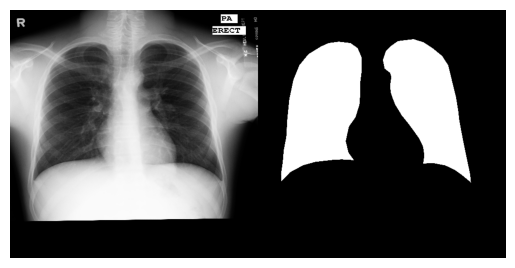

In [ ]:
sample_image_path = os.path.join(train_img_dir, os.listdir(train_img_dir)[6])  # Get the image file
display_image_from_file(sample_image_path)

### Display image size
Images are of size 512x1024

In [ ]:
def display_image_shape(image_path):
    try:
        img = cv2.imread(image_path)
        if img is not None:
            print(f"Image shape at {image_path}: {img.shape}")
        else:
            print(f"Error: Could not read image at {image_path}")
    except Exception as e:
        print(f"An unexpected error occurred: {e}")

display_image_shape(sample_image_path)


Image shape at /content/drive/MyDrive/Lung_Segmentation/Lung_ds/20250414-004844/train/img/MCUCXR_0075_0.png: (512, 1024, 3)


### Load image dataset

In [ ]:
def load_image_dataset(data_dir,target_image_size,count):
    input_images = []
    real_images = []
    cnt = 0

    for filename in listdir(data_dir):
        # Load image into PIL format
        image  = load_img(data_dir + filename,color_mode='rgb', target_size=target_image_size)
        #PIL Image instance to a NumPy array
        image_array = img_to_array(image)

        target_image_ht = target_image_size[0]
        target_image_wd = target_image_size[1]

        # split the dataset into source and target images
        input_image = image_array[:, :int(target_image_wd/2)]
        real_image = image_array[:, int(target_image_wd/2):]

        #append to the list to be processed
        input_images.append(input_image)
        real_images.append(real_image)

        cnt += 1
        if cnt == count:
          break

    # convert to np arrays
    input_images = np.array(input_images)
    real_images = np.array(real_images)

    # save the images to np file
    filename = "/content/drive/MyDrive/Pix_Model/source_extracted/images.npz"
    np.savez_compressed(filename, input_images, real_images)

    return input_images,real_images

In [ ]:
# set the target image size to accomodate paired 256x256 images
target_image_size = (512,1024)
input_images,real_images = load_image_dataset(train_img_dir,target_image_size,10)

## Display X-ray and mask images

In [ ]:
def display_image(input_images,real_images,image_index):

    # Check if the index is valid
    if 0 <= image_index < len(input_images):
        # Display the image using matplotlib
        plt.subplot(1,2,1)
        plt.title('Input Image')
        plt.imshow(input_images[image_index].astype(np.uint8))
        plt.subplot(1,2,2)
        plt.title('Real Image')
        plt.imshow(real_images[image_index].astype(np.uint8))
        plt.show()
    else:
        print(f"Error: Invalid image index {image_index}.")

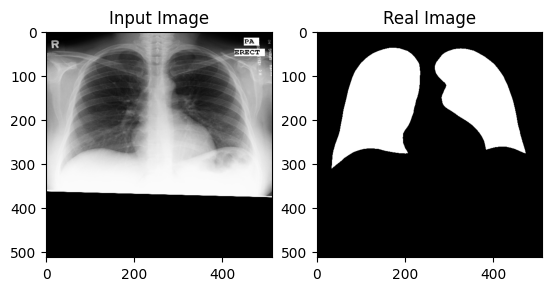

In [ ]:
image_index = 3
display_image(input_images,real_images,image_index)

## **Dataset Pre-Processing**


*   Resize Images to 286x286
*   Random crop Images to 256x256
*   Random Flip left to right/Mirroring






### Define function to Resize Image

In [ ]:
def resize_image(input_image,real_image, new_height, new_width):

  # Resize the input image using tf.image.resize
  input_image = tf.image.resize(
        input_image
       ,[new_height, new_width]
       ,method=tf.image.ResizeMethod.NEAREST_NEIGHBOR
  )

  # Resize the real image using tf.image.resize
  real_image = tf.image.resize(
        real_image
       ,[new_height, new_width]
       ,method=tf.image.ResizeMethod.NEAREST_NEIGHBOR
  )

  return input_image, real_image

### Display a sample image after resizing

Resized source image shape: (286, 286, 3)
Resized target image shape: (286, 286, 3)


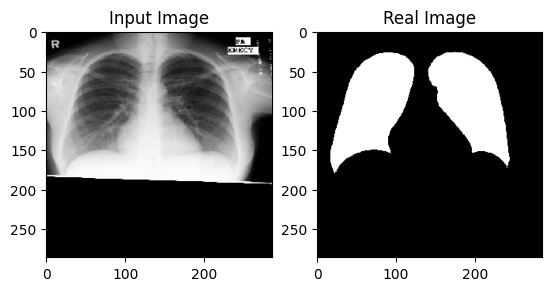

In [ ]:
image_index = 2  # Choose an image
input_image, real_image = resize_image(input_images[image_index], real_images[image_index],286, 286)
print("Resized source image shape:",input_image.shape)
print("Resized target image shape:",real_image.shape)
display_image(np.array([input_image]), np.array([real_image]), 0) #display the resized image

### Define function to Random Crop

In [ ]:
def random_crop(input_image,real_image,img_ht,img_wd):

    stacked_image = tf.stack([input_image, real_image], axis=0)

    cropped_image = tf.image.random_crop(
                         stacked_image, size=[2, img_ht, img_wd, 3])

    return cropped_image[0], cropped_image[1]


### Display a sample image after random cropping

Cropped source image shape: (256, 256, 3)
Cropped target image shape: (256, 256, 3)


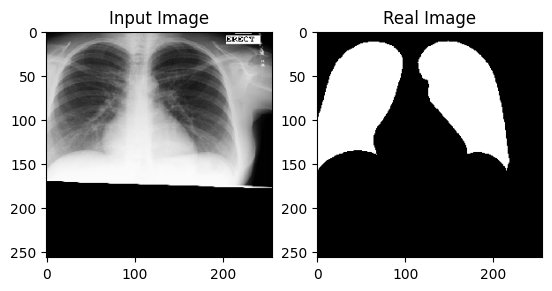

In [ ]:
input_image,real_image = random_crop(input_image,real_image,256,256) #Random crop to 256x256 size
print("Cropped source image shape:",input_image.shape)
print("Cropped target image shape:",real_image.shape)
display_image(np.array([input_image]), np.array([real_image]), 0) #display the cropped image

### Define function to Random Flip Images

In [ ]:
def random_flip(image):
    image = tf.image.flip_left_right(image)
    return image

### Display a sample image after random flipping

Randomly flipped source image shape: (256, 256, 3)
Randomly flipped target image shape: (256, 256, 3)


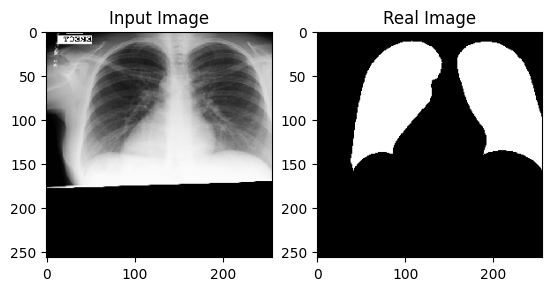

In [ ]:
input_image = random_flip(input_image)
real_image = random_flip(real_image)
print("Randomly flipped source image shape:",input_image.shape)
print("Randomly flipped target image shape:",real_image.shape)
display_image(np.array([input_image]), np.array([real_image]), 0) #display the flipped image

### Define a function to Normalize Images

In [ ]:
# Normalizing the images to [-1, 1]
def normalize(input_image, real_image):
  input_image = (input_image / 127.5) - 1
  real_image = (real_image / 127.5) - 1

  return input_image, real_image

### Normalize Images and print Image Shape

In [ ]:
input_image,real_image = normalize(input_image,real_image)
print("Normalized source image shape:",input_image.shape)
print("Normalized target image shape:",real_image.shape)


Normalized source image shape: (256, 256, 3)
Normalized target image shape: (256, 256, 3)


## **Building a Data Pre-Processing Pipeline**

Data Pre-Processing pipeline to process the images - Load, Resize, Crop, Flip and Normalize for train and test datasets

In [ ]:
IMG_HT = 256          # Image height
IMG_WD = 256          # Image width

RESIZE_IMG_HT = 286   # Resize Image height
RESIZE_IMG_WD = 286   # Resize Image width

BUFFER_SIZE = 562     # size of training dataset
BATCH_SIZE = 1        # Batch size of 1 is found to be optimal for Pix2Pix


### Load Image Dataset

In [ ]:
def load(image_file):
  # Read and decode an image file to a uint8 tensor
  image = tf.io.read_file(image_file)
  image = tf.io.decode_jpeg(image)

  # Split each image tensor into two tensors i.e.; input and real
  w = tf.shape(image)[1]
  w = w // 2
  input_image = image[:, :w, :]
  real_image = image[:, w:, :]

  # Convert both images to float32 tensors
  input_image = tf.cast(input_image, tf.float32)
  real_image = tf.cast(real_image, tf.float32)

  return input_image, real_image

### Random Jitter - Resize, Random Crop and Random Flip Images

In [ ]:
def random_jitter(input_image, real_image):
  # Resizing
  input_image,real_image = resize_image(input_image,real_image, RESIZE_IMG_HT, RESIZE_IMG_WD)

  # Random cropping back to 256x256
  input_image,real_image = random_crop(input_image,real_image,IMG_HT,IMG_WD)

  if tf.random.uniform(()) > 0.5:
    # Random mirroring
    input_image = random_flip(input_image)
    real_image = random_flip(real_image)

  return input_image,real_image

### Train Pipeline

In [ ]:
def load_image_train(image_file):
  input_image, real_image = load(image_file)
  input_image, real_image = random_jitter(input_image, real_image)
  input_image, real_image = normalize(input_image, real_image)

  return input_image, real_image

In [ ]:
train_dataset = tf.data.Dataset.list_files(train_img_dir + '*.png')
train_dataset = train_dataset.map(load_image_train,
                                  num_parallel_calls=tf.data.AUTOTUNE)
train_dataset = train_dataset.shuffle(BUFFER_SIZE)  # Shuffle dataset
train_dataset = train_dataset.batch(BATCH_SIZE)     # Batch dataset

### Test Pipeline

In [ ]:
def load_image_test(image_file):
  input_image, real_image = load(image_file)
  input_image, real_image = resize_image(input_image, real_image,
                                   IMG_HT, IMG_WD)
  input_image, real_image = normalize(input_image, real_image)

  return input_image, real_image

In [ ]:
test_dataset = tf.data.Dataset.list_files(test_img_dir + '*.png')
test_dataset = test_dataset.map(load_image_test)
test_dataset = test_dataset.batch(BATCH_SIZE)   # Batch dataset

### Print input tensor shape

In [ ]:
input_tensor, real_tensor = next(iter(train_dataset))
input_tensor.shape

TensorShape([1, 256, 256, 3])

##**Generator**

The generator's goal in a Pix2Pix GAN is to learn a mapping from an input image (the conditional input in the form of X-ray images) to an output image (segmentation mask). Unlike traditional GAN generators that take random noise as input, the Pix2Pix generator takes a conditional input image.

The generator in a Pix2Pix GAN is a **U-Net architecture** that takes a conditional input image and learns to produce a corresponding output image in a target domain. The U-Net's skip connections are crucial for preserving spatial details

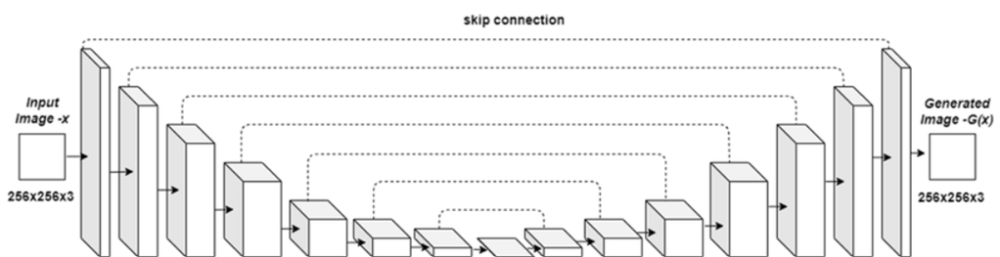

In [ ]:
# import libraries
import tensorflow as tf
from tensorflow.keras.models import Model
from tensorflow.keras.layers import Conv2D, BatchNormalization, LeakyReLU, Input
from tensorflow.keras.layers import Conv2DTranspose, Activation, Concatenate, Dropout
from tensorflow.keras.initializers import RandomNormal

### Define Encoder Block
The Encoder Block Transforms an input into lower-dimensional representation that captures the essential information of the input.

The encoder consists of a series of downsampling blocks (typically convolutional layers with strided convolutions or pooling) that progressively reduce the spatial dimensions and extract hierarchical features.

At the bottleneck of the U-Net, the lowest-resolution, highest-level feature map is obtained.

Each Encoder block is a combination of **Conv2D + Batch Normalization  + Leaky Relu Activation**

In [ ]:
def encoder_block(layer_in,size,filters, batchnorm=True):
	# weight initialization
	init = RandomNormal(stddev=0.02)
	# add downsampling layer
	X = Conv2D(filters,size, strides=2, padding='same', kernel_initializer=init)(layer_in)
	# conditionally add batch normalization
	if batchnorm:
		X = BatchNormalization()(X, training=True)
	# leaky relu activation
	encoder_block = LeakyReLU(alpha=0.2)(X)

	return encoder_block


/usr/local/lib/python3.11/dist-packages/keras/src/layers/activations/leaky_relu.py:41: UserWarning: Argument `alpha` is deprecated. Use `negative_slope` instead.
  warnings.warn(


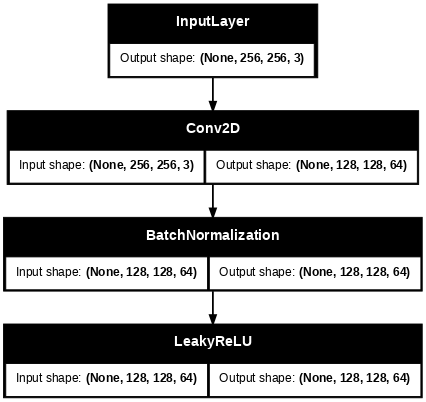

In [ ]:
input = Input(shape=(256,256,3))
encoder_block(input,4,64)
encoder_model = Model(input, encoder_block(input,4,64))
tf.keras.utils.plot_model(encoder_model, show_shapes=True, dpi=64)

### Define Decoder Block

The decoder part of the **U-Net** takes the compressed, lower-dimensional feature representations learned by the encoder and progressively upsamples them to generate the final output image at the desired resolution

The Decoder Block is made up of: **Transposed Convolution (deconvolution) + Batch Normalization + Relu Actication**

The decoder Block utilizes **skip connections**. The output of an encoder layer at a certain spatial resolution is directly concatenated with the input of the corresponding decoder layer.  This allows the decoder to access both high-level semantic information from the deeper encoder layers and low-level details from the earlier encoder layers. This helps in generating more detailed and accurate output images.

Drop out is used a regularization technique and to introduce randomness/noise as input to the GAN

In [ ]:
def decoder_block(layer_in,size, skip_in, filters, dropout=True):
	# weight initialization
	init = RandomNormal(stddev=0.02)
	# add upsampling layer
	Y = Conv2DTranspose(filters,size, strides=2, padding='same', kernel_initializer=init)(layer_in)
	# add batch normalization
	Y = BatchNormalization()(Y, training=True)
	# conditionally add dropout
	if dropout:
		Y = Dropout(0.5)(Y, training=True)
	# merge with skip connection
	Y = Concatenate()([Y, skip_in])
	# relu activation
	decoder_block = Activation('relu')(Y)
	return decoder_block

### Define Generator

The architecture of the generator is symmetric, with a contracting path (encoder) and an expansive path (decoder) connected by skip connections.

Features of the generator network -

**Encoder**:
*   The number of output channels or feature maps doubles at each downsampling step (128, 256, 512 etc)
*   Conv layers with 4x4 filters are used
*   The step size for sliding the filter is set to 2 used for downsampling, halving the spatial dimensions.

**Bottleneck Layer**:

The bottleneck is the deepest part of the U-Net, connecting the encoder and decoder


*   Convolutional layer without batch normalization and ReLU Activation

**Decoder**:

The decoder consists of a series of upsampling blocks
*   The number of output channels or feature maps halves at each upsampling step (512, 256, 128 etc) matching the corresponding layer in the encoder
*   The kernel size, stride, and padding are set same as encoder
*   Dropout included in the earlier decoder layers for regularization


*   The output of the transposed convolution is concatenated with the corresponding feature map from the encoder (via the skip connection).

**Output**:

The final layer of the generator produces the output image. It consists of:


*   3 output channels to produce RGB image
*   tanh activation function as target image in normalized in [-1,1] range

7 layers of encoder and decoder blocks are used for this task.










In [ ]:
def generator(image_shape=(256,256,3)):
    # weight initialization
    init = RandomNormal(stddev=0.02)
    # image input
    in_image = Input(shape=image_shape)
    # encoder model
    e1 = encoder_block(in_image,4, 64, batchnorm=False)
    e2 = encoder_block(e1,4, 128)
    e3 = encoder_block(e2,4, 256)
    e4 = encoder_block(e3,4, 512)
    e5 = encoder_block(e4,4, 512)
    e6 = encoder_block(e5,4, 512)
    e7 = encoder_block(e6,4, 512)
    # bottleneck, no batch norm and relu
    b = Conv2D(512, (4,4), strides=(2,2), padding='same', kernel_initializer=init)(e7)
    b = Activation('relu')(b)
    # decoder model
    d1 = decoder_block(b,4, e7, 512)
    d2 = decoder_block(d1,4, e6, 512)
    d3 = decoder_block(d2,4, e5, 512)
    d4 = decoder_block(d3,4, e4, 512, dropout=False)
    d5 = decoder_block(d4,4, e3, 256, dropout=False)
    d6 = decoder_block(d5,4, e2, 128, dropout=False)
    d7 = decoder_block(d6,4, e1, 64, dropout=False)
    # output
    X = Conv2DTranspose(3, (4,4), strides=(2,2), padding='same', kernel_initializer=init)(d7)
    out_image = Activation('tanh')(X)
    # define model

    model = Model(in_image, out_image)
    return model

/usr/local/lib/python3.11/dist-packages/keras/src/layers/activations/leaky_relu.py:41: UserWarning: Argument `alpha` is deprecated. Use `negative_slope` instead.
  warnings.warn(


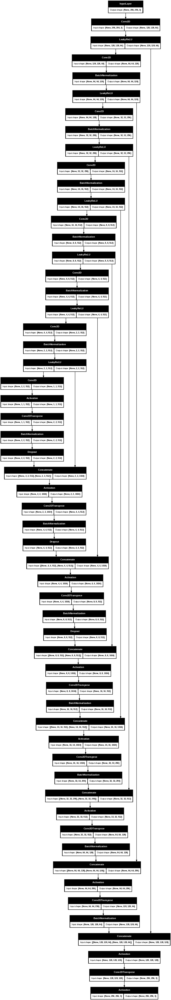

In [ ]:
# Plot generator architecture
generator = generator()
tf.keras.utils.plot_model(generator, show_shapes=True, dpi=50)

### Plot the Generator output and compare it with real output (Before Training)

In [ ]:
#sample generator output
gen_output = generator(input_tensor)

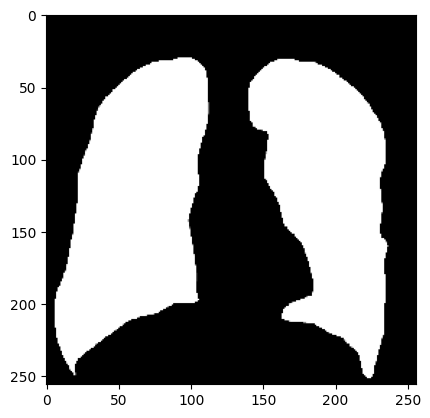

In [ ]:
# Plot real output
plt.imshow(tf.squeeze(real_tensor, axis=0))

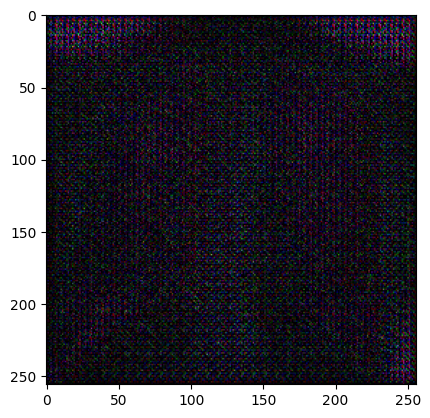

In [ ]:
# Plot the sample generator output. This is without any training so the output image is far off from the expected real image
plt.imshow(tf.squeeze(gen_output, axis=0))

## **Discriminator**

The discriminator in a Pix2Pix GAN is tasked with distinguishing between "real" image pairs (input image and the corresponding ground truth output) and "fake" image pairs (input image and the output generated by the generator)

The discriminator receives a concatenation of two images as its input:



1.   The Conditional Input Image: This is the same input that was fed into the generator (X-ray image)
2.   The Output Image: This is either the ground truth target image (for real pairs) or the image generated by the generator (for fake pairs).

These two images are stacked along the channel dimension resulting in an input of 6 channels

The key idea behind PatchGAN is that instead of classifying the entire image pair as real or fake, it tries to classify whether each N×N patch of the output image is realistic conditioned on the corresponding patch of the input image

PatchGAN discriminator consists of a series of convolutional layers that progressively downsample the input, followed by a final layer that outputs the real/fake predictions.

Here we use a PatchGAN of 16x16 output map size

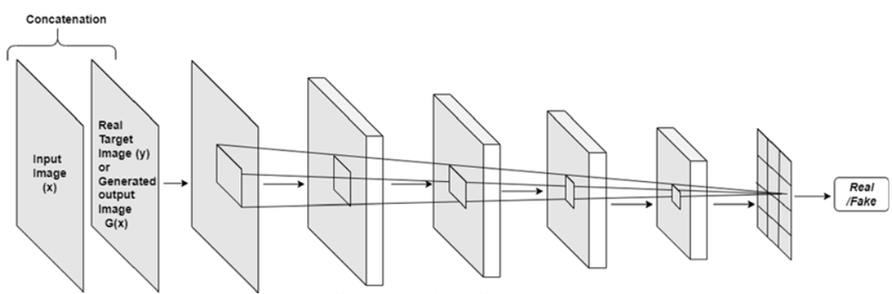


In [ ]:
def discriminator(image_shape=(256,256,3)):
	# weight initialization
	init = RandomNormal(stddev=0.02)
	# source image input
	src_image = Input(shape=image_shape)
	# target image input
	target_image = Input(shape=image_shape)
	# concatenate images channel-wise
	merged = Concatenate()([src_image, target_image])
	# C64
	d = Conv2D(64, (4,4), strides=(2,2), padding='same', kernel_initializer=init)(merged)
	d = LeakyReLU(alpha=0.2)(d)
	# C128
	d = Conv2D(128, (4,4), strides=(2,2), padding='same', kernel_initializer=init)(d)
	d = BatchNormalization()(d)
	d = LeakyReLU(alpha=0.2)(d)
	# C256
	d = Conv2D(256, (4,4), strides=(2,2), padding='same', kernel_initializer=init)(d)
	d = BatchNormalization()(d)
	d = LeakyReLU(alpha=0.2)(d)
	# C512
	d = Conv2D(512, (4,4), strides=(2,2), padding='same', kernel_initializer=init)(d)
	d = BatchNormalization()(d)
	d = LeakyReLU(alpha=0.2)(d)
	# second last output layer
	d = Conv2D(512, (4,4), padding='same', kernel_initializer=init)(d)
	d = BatchNormalization()(d)
	d = LeakyReLU(alpha=0.2)(d)
	# patch output
	d = Conv2D(1, (4,4), padding='same', kernel_initializer=init)(d)
	# define model
	disc_model = Model([src_image, target_image], d)

	return disc_model

/usr/local/lib/python3.11/dist-packages/keras/src/layers/activations/leaky_relu.py:41: UserWarning: Argument `alpha` is deprecated. Use `negative_slope` instead.
  warnings.warn(


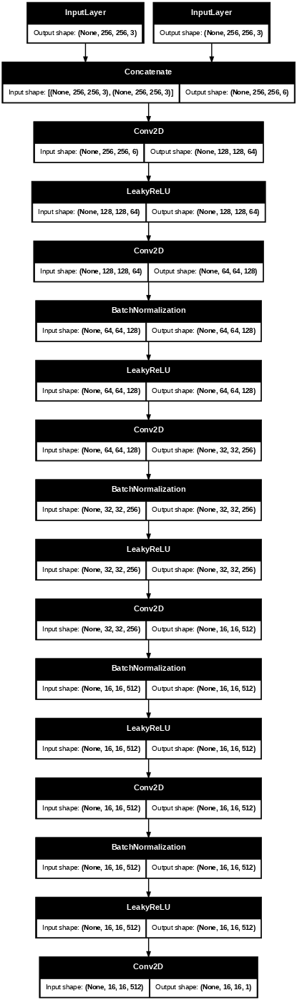

In [ ]:
discriminator = discriminator()
tf.keras.utils.plot_model(discriminator, show_shapes=True, dpi=50)

### Plot the output of the discriminator for input-generated output pair

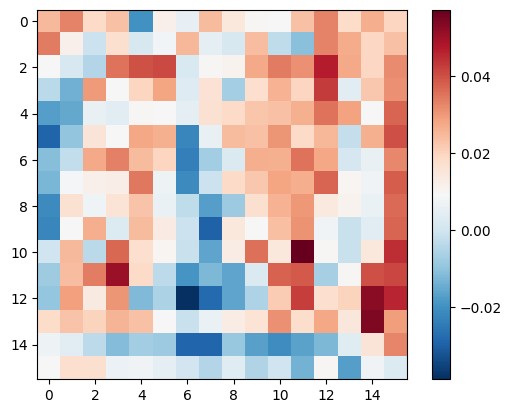

In [ ]:
disc_out = discriminator([input_tensor, gen_output], training=False)
plt.imshow(disc_out[0, ..., -1], cmap='RdBu_r')
plt.colorbar()

### Plot the output of the discriminator for input-real output pair

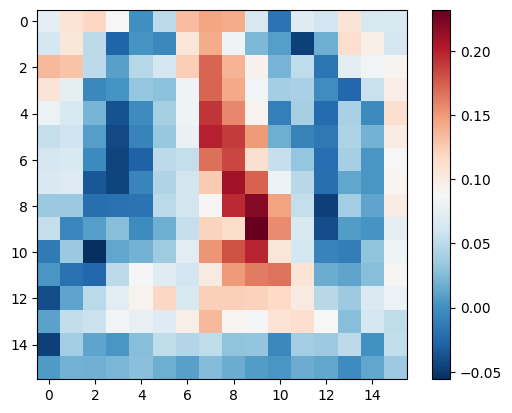

In [ ]:
disc_out = discriminator([input_tensor, real_tensor], training=False)
plt.imshow(disc_out[0, ..., -1], cmap='RdBu_r')
plt.colorbar()

## **Loss functions**

In [ ]:
# use Binary cross entropy as loss object as discriminator performs a Binary classification task
loss_object = tf.keras.losses.BinaryCrossentropy(from_logits=True)

# Lambda is the hyper parameter which defines the weight of the L1 Loss for the generator
LAMBDA = 100

### Generator Loss

The generator loss in a Pix2Pix Generative Adversarial Network (GAN) is a composite loss function that guides the generator to produce images that are both realistic (able to fool the discriminator) and close to the ground truth target images

It consists of 2 components:
*   Adversarial loss - To make the generated images indistinguishable from real images in the target domain, according to the discriminator
*   Content loss - L1 loss To ensure that the generated image is not just realistic but also structurally and visually similar to the ground truth target image.

The final generator loss in Pix2Pix is a weighted sum of the adversarial loss and the L1 loss:

  GAN Loss + LAMBDA * L1 Loss

  LAMBDA is set to 100





In [ ]:
def generator_loss(disc_generated_output, gen_output, target):
  gan_loss = loss_object(tf.ones_like(disc_generated_output), disc_generated_output) # y_true  = 1, y_pred = generated output

  # Mean absolute error
  l1_loss = tf.reduce_mean(tf.abs(target - gen_output))

  total_gen_loss = gan_loss + (LAMBDA * l1_loss)

  return total_gen_loss, gan_loss, l1_loss

The discriminator's goal is to correctly classify real data samples as "real" and generated data samples as "fake." Its loss function is designed to achieve this.

Discriminator Loss = Real Loss + Generated Loss

In [ ]:
def discriminator_loss(disc_real_output, disc_generated_output):
  real_loss = loss_object(tf.ones_like(disc_real_output), disc_real_output)

  generated_loss = loss_object(tf.zeros_like(disc_generated_output), disc_generated_output)

  total_disc_loss = real_loss + generated_loss

  return total_disc_loss

## **Define Optimizer**

Use Adam Optimizer for both Generator and Discriminator with an intial learning rate of 0.00002

In [ ]:
from tensorflow.keras.optimizers import Adam

In [ ]:
import time
import imageio
from IPython import display

In [ ]:
# Set the learning rate

generator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5) #set learning rate to 2e-4
discriminator_optimizer = tf.keras.optimizers.Adam(2e-4, beta_1=0.5) #set learning rate to 2e-4


## **Learning Rate Scheduling**

Learning Rate Scheduling refers to the practice of changing the learning rate during the training process. Instead of using a fixed learning rate throughout the entire training, we adjust it based on the number of epochs

In [ ]:
def reduce_optimizer_lr(factor):
    '''reduce optimizer_learning rate'''
    generator_optimizer.learning_rate = generator_optimizer.learning_rate * factor
    discriminator_optimizer.learning_rate = discriminator_optimizer.learning_rate * factor

    print(f'Reduce Learning Rate to {generator_optimizer.learning_rate}')

    return None

In [ ]:
checkpoint_dir = '/content/drive/MyDrive/Pix_Model/Checkpoint_dir'
checkpoint_prefix = os.path.join(checkpoint_dir, "ckpt")
checkpoint = tf.train.Checkpoint(generator_optimizer=generator_optimizer,
                                 discriminator_optimizer=discriminator_optimizer,
                                 generator=generator,
                                 discriminator=discriminator)

## **Plot generated vs ground-truth image**

In [ ]:
timestr = time.strftime("%Y%m%d-%H%M%S")
training_dir = '/content/drive/MyDrive/Pix_Model/Training_progress_' + timestr

In [ ]:
def plot_images(model, test_input, real,save_fig=False,save_dir=training_dir):
  prediction = model(test_input, training=True)
  plt.figure(figsize=(15, 15))
  fig,ax = plt.subplots(1,3,figsize=(15, 5))

  display_list = [test_input[0], real[0], prediction[0]]
  title = ['Input Image', 'Ground Truth', 'Predicted Image']

  for i,axis in enumerate(ax):
    axis.set_title(title[i])
    # Getting the pixel values in the [0, 1] range to plot.
    axis.imshow(display_list[i] * 0.5 + 0.5)
    axis.set_axis_off()
  plt.show()

  if save_fig:
    # Create the destination directory if it doesn't exist
    if not os.path.exists(save_dir):
        os.makedirs(save_dir)

    timestr = time.strftime("%Y%m%d-%H%M%S")
    save_name = f'{save_dir}/im_{timestr}'
    fig.savefig(save_name,bbox_inches='tight', pad_inches=0)

<Figure size 1500x1500 with 0 Axes>

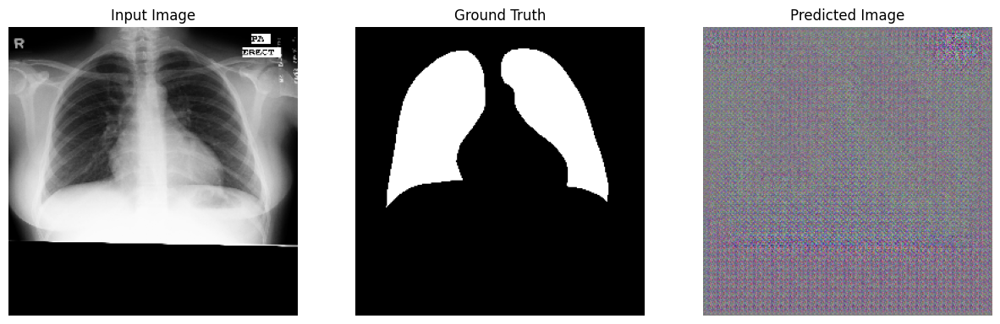

In [ ]:
for example_input, example_target in test_dataset.take(1):
  plot_images(generator, example_input, example_target,save_fig=True)

## **Logging**

In [ ]:
from datetime import datetime

In [ ]:
log_dir="/content/drive/MyDrive/Lung_Segmentation/Logs/"

# Create the destination directory if it doesn't exist
if not os.path.exists(log_dir):
  os.makedirs(log_dir + "fit/")

summary_writer = tf.summary.create_file_writer(
  log_dir + "fit/" + datetime.now().strftime("%Y%m%d-%H%M%S"))

## **Model Training**

For each training step:

*   Calculate the generator and discriminator loss
*   Apply the gradients to update the parameters

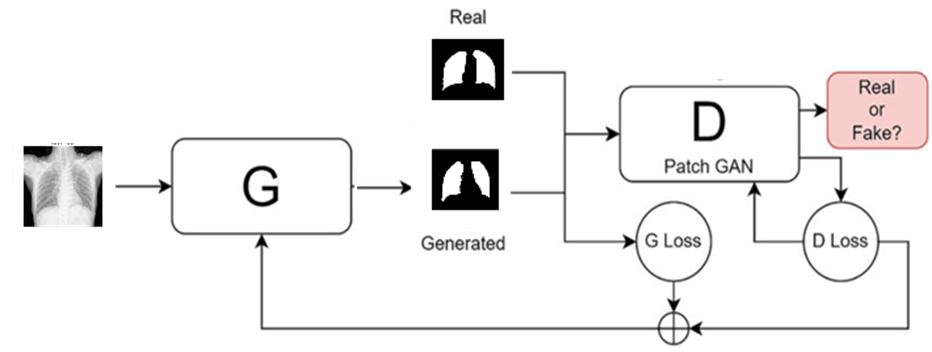




In [ ]:
@tf.function
def train_step(input_image, target, step):
  with tf.GradientTape() as gen_tape, tf.GradientTape() as disc_tape:
    gen_output = generator(input_image, training=True)

    disc_real_output = discriminator([input_image, target], training=True)
    disc_generated_output = discriminator([input_image, gen_output], training=True)

    gen_total_loss, gen_gan_loss, gen_l1_loss = generator_loss(disc_generated_output, gen_output, target)
    disc_loss = discriminator_loss(disc_real_output, disc_generated_output)

  generator_gradients = gen_tape.gradient(gen_total_loss,
                                          generator.trainable_variables)
  discriminator_gradients = disc_tape.gradient(disc_loss,
                                               discriminator.trainable_variables)

# apply the gradients to the training weights
  generator_optimizer.apply_gradients(zip(generator_gradients,
                                          generator.trainable_variables))
  discriminator_optimizer.apply_gradients(zip(discriminator_gradients,
                                              discriminator.trainable_variables))


  with summary_writer.as_default():
    tf.summary.scalar('gen_total_loss', gen_total_loss, step=step//1000)
    tf.summary.scalar('gen_gan_loss', gen_gan_loss, step=step//1000)
    tf.summary.scalar('gen_l1_loss', gen_l1_loss, step=step//1000)
    tf.summary.scalar('disc_loss', disc_loss, step=step//1000)

## **Fit the Model**

Fit the Pix2Pix Model for each batch of test inputs in steps

Plot the generated image vs. real image after every 1000 steps

In [ ]:
def fit(train_ds, test_ds, steps):
  example_input, example_target = next(iter(test_ds.take(1)))
  start = time.time()

  for step, (input_image, target) in train_ds.repeat().take(steps).enumerate():
    if (step) % 1000 == 0:
      display.clear_output(wait=True)

      if step != 0:
        print(f'Time taken for 1000 steps: {time.time()-start:.2f} sec\n')

      start = time.time()

      plot_images(generator, example_input, example_target,save_fig=True)
      print(f"Step: {step//1000}k")

    train_step(input_image, target, step)

    # Training step
    if (step+1) % 10 == 0:
      print('.', end='', flush=True)

    if (step) % 1000 == 0:
        disc_save_path = "/content/drive/MyDrive/Pix_Model/Model/pix_discriminator.keras"
        os.makedirs(os.path.dirname(disc_save_path), exist_ok=True)
        discriminator.save(disc_save_path)
        generator_save_path = "/content/drive/MyDrive/Pix_Model/Model/pix_generator.keras"
        os.makedirs(os.path.dirname(generator_save_path), exist_ok=True)
        generator.save(generator_save_path)

        #reduce learning rate
        reduce_optimizer_lr(factor=0.75)

    # Save (checkpoint) the model every 5k steps
    if (step + 1) % 5000 == 0:
      checkpoint.save(file_prefix=checkpoint_prefix)

Time taken for 1000 steps: 133.42 sec



<Figure size 1500x1500 with 0 Axes>

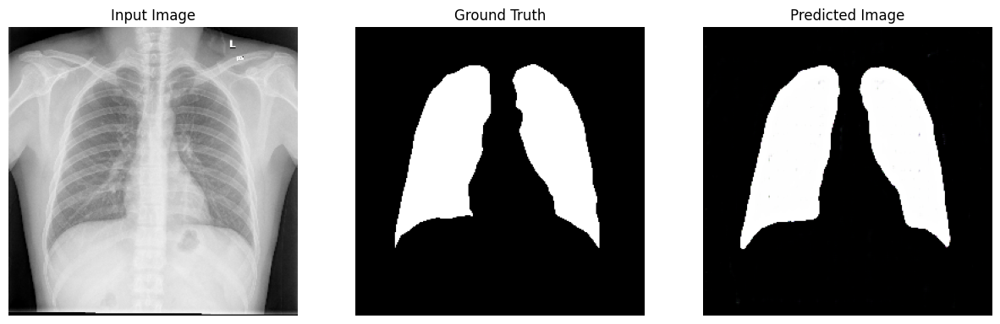

Step: 10k
Reduce Learning Rate to <Variable path=adam/learning_rate, shape=(), dtype=float32, value=8.447028449154459e-06>
....................................................................................................

In [ ]:
fit(train_dataset, test_dataset, steps=11000)

In [ ]:
log_dir

'/content/drive/MyDrive/Lung_Segmentation/Logs/'

In [ ]:
log_dir = "/content/drive/MyDrive/Lung_Segmentation/Logs/fit/20250414-005348"

## **Log the Loss** function outputs to Tensorboard

In [ ]:
%load_ext tensorboard
%tensorboard --logdir {log_dir}

<IPython.core.display.Javascript object>

In [ ]:
import glob
from IPython.display import Image, display

## **Show Training Progress using GIF**

<ipython-input-91-c33d1b75491e>:8: DeprecationWarning: Starting with ImageIO v3 the behavior of this function will switch to that of iio.v3.imread. To keep the current behavior (and make this warning disappear) use `import imageio.v2 as imageio` or call `imageio.v2.imread` directly.
  image_list.append(imageio.imread(file_name))


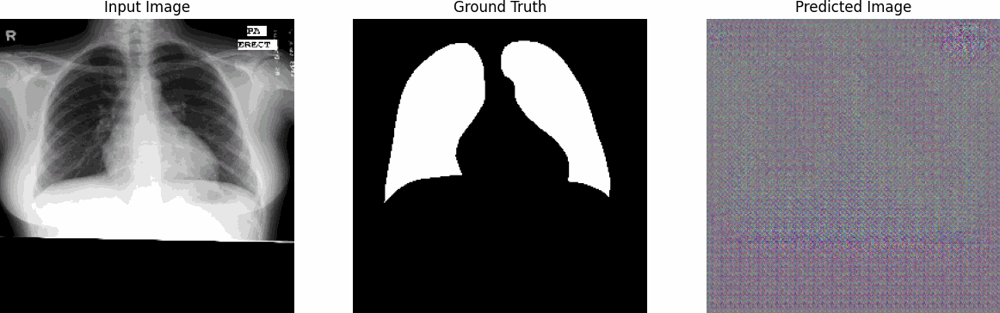

In [ ]:
#sort the generated image by sequence
training_progress = list(sorted(glob.glob(training_dir+'/*png'),key = lambda x: int(x.split('_')[-1].split('.')[0].split('-')[-1])))


# generating a GIff
image_list = []
for file_name in training_progress:
    image_list.append(imageio.imread(file_name))

#write as a giff file
gif_file_dir = '/content/drive/MyDrive/Pix_Model/Training_progress' # Extract directory path
gif_file_name = 'training_progress_' + datetime.now().strftime("%Y%m%d-%H%M%S") + '.gif' #Extract file name

# Create directory if does not exist
if not os.path.exists(gif_file_dir):
  os.makedirs(gif_file_dir)


# Join path and file name to create full path
gif_file = os.path.join(gif_file_dir, gif_file_name)

#write as a giff file
#gif_file = '/content/drive/MyDrive/Pix_Model/Training_progress/training_progress_' + datetime.now().strftime("%Y%m%d-%H%M%S") + '.gif'
imageio.mimwrite(gif_file,
                 image_list,
                 fps = 3)



display(Image(data = gif_file,width = 1200, height = 400))

In [ ]:
checkpoint.restore(tf.train.latest_checkpoint(checkpoint_dir))

#### **Plot Sample Predictions with Input Image and Ground Truth**

<Figure size 1500x1500 with 0 Axes>

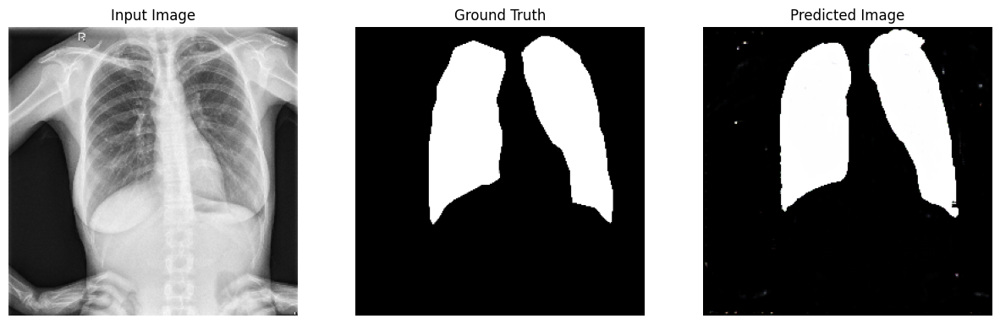

<Figure size 1500x1500 with 0 Axes>

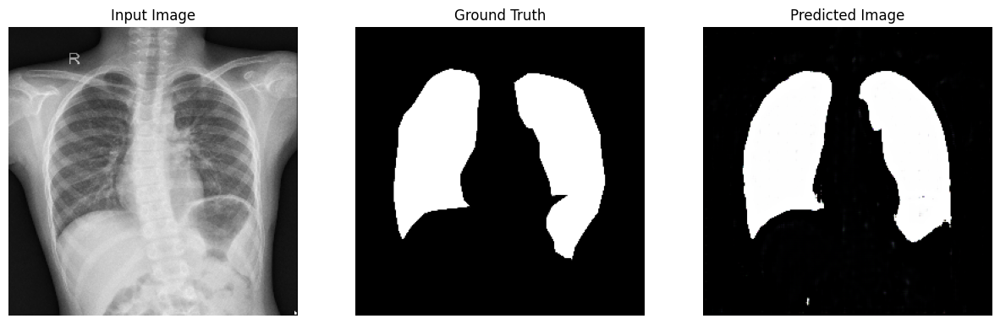

<Figure size 1500x1500 with 0 Axes>

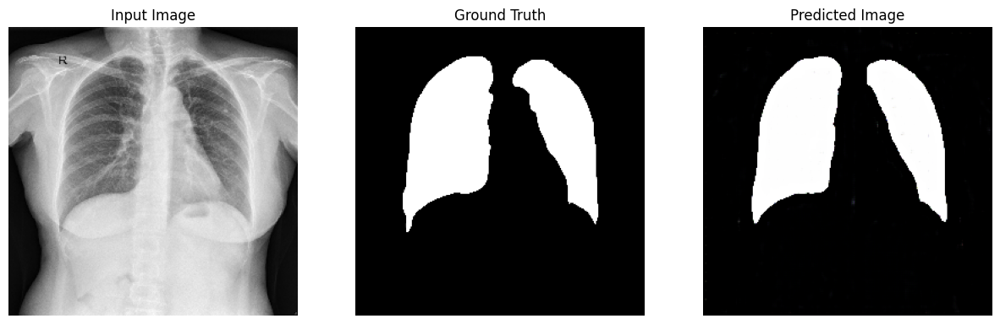

<Figure size 1500x1500 with 0 Axes>

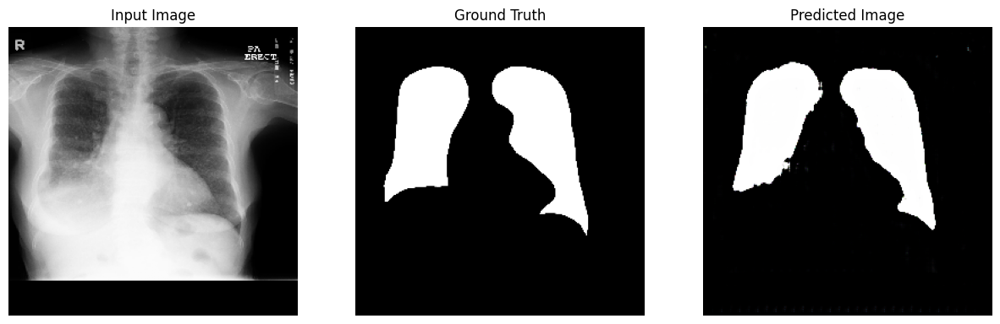

<Figure size 1500x1500 with 0 Axes>

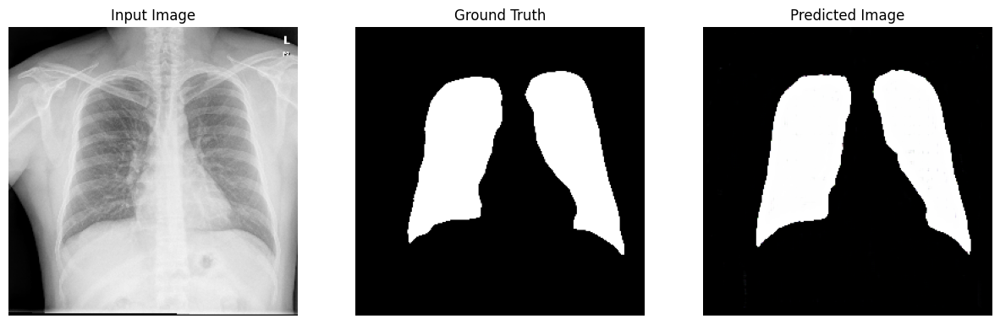

In [ ]:
# Run the trained model on a few examples from the test set
for inp, tar in test_dataset.take(5):
  plot_images(generator, inp, tar)

## **Performance Metrics**

## **Plot IOU**

In [ ]:
def calculate_iou(y_true, y_pred):
    """Calculates the Intersection over Union (IoU) for segmentation tasks.

    Args:
        y_true: Ground truth segmentation mask (tensor).
        y_pred: Predicted segmentation mask (tensor).  Assumed to be in the range [-1, 1] due to tanh activation.

    Returns:
        The IoU value (scalar tensor).
    """

    # Convert predictions from tanh range [-1, 1] to probability range [0, 1]
    y_pred = (y_pred + 1) / 2

    # Create binary masks based on a threshold (e.g., 0.5)
    y_pred_bin = tf.cast(y_pred > 0.5, tf.float32)
    y_true_bin = tf.cast(y_true > 0.5, tf.float32)  # Assuming y_true is already binary

    # Calculate intersection and union
    intersection = tf.reduce_sum(y_true_bin * y_pred_bin)
    union = tf.reduce_sum(y_true_bin) + tf.reduce_sum(y_pred_bin) - intersection

    # Avoid division by zero
    iou = tf.cond(tf.equal(union, 0), lambda: tf.constant(1.0), lambda: intersection / union)

    return iou


In [ ]:
iou_scores = []
for inp, tar in test_dataset:
    gen_output = generator(inp, training=False)
    # Assuming you want to compare the first image in the batch
    iou = calculate_iou(tf.squeeze(tar, axis=0).numpy(),tf.squeeze(gen_output, axis=0).numpy())
    iou_scores.append(iou)
average_iou = np.mean(iou_scores)
print(f"Average IoU: {average_iou}")

Average IoU: 0.8942468762397766


## Average IOU: 89.42%

## **Plot DICE Scores**

In [ ]:
def dice_coefficient(y_true, y_pred):
    """Calculates the Dice coefficient for segmentation tasks.

    Args:
        y_true: Ground truth segmentation mask (tensor or numpy array).
        y_pred: Predicted segmentation mask (tensor or numpy array). Assumed to be in the range [-1, 1] due to tanh activation.

    Returns:
        The Dice coefficient value (scalar).
    """
    # Convert predictions from tanh range [-1, 1] to probability range [0, 1]
    y_pred = (y_pred + 1) / 2

    # Create binary masks based on a threshold (e.g., 0.5)
    y_pred_bin = (y_pred > 0.5).astype(np.float32)
    y_true_bin = (y_true > 0.5).astype(np.float32)

    intersection = np.sum(y_true_bin * y_pred_bin)
    sum_of_squares = np.sum(y_true_bin) + np.sum(y_pred_bin)

    # Avoid division by zero
    if sum_of_squares == 0:
        return 1.0  # Or 0.0, depending on your preference

    dice = (2.0 * intersection) / sum_of_squares
    return dice

dice_scores = []
for inp, tar in test_dataset:
    gen_output = generator(inp, training=False)
    # Assuming you want to compare the first image in the batch
    dice = dice_coefficient(tf.squeeze(tar, axis=0).numpy(), tf.squeeze(gen_output, axis=0).numpy())
    dice_scores.append(dice)
average_dice = np.mean(dice_scores)
print(f"Average Dice Coefficient: {average_dice}")


Average Dice Coefficient: 0.9382697939872742


## Average Dice coefficient: 93.82%

### The results above show the effectiveness of Pix2Pix GAN in image segmentation tasks
